---
# 
---

In this notebook

In [55]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 

import plotly.express as px

import joblib

from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

from sklearn.metrics import mean_squared_error

### Define files

In [2]:
data_dir = '../data/'
model_dir = '../model/'

ghg = 'GreenHouse_Gases/processed/'

frequency = 'DLY'

climate_file = 'ECCC/processed/daily/daily_processed.csv'
#climate_file = 'ECCC/processed/monthly/monthly_processed.csv'

population_file = 'Population/processed/Montreal.csv'

co2_file = 'ch4_1850-2099_SSP2_45.csv'
ch4_file = 'co2_1850-2099_SSP2_45.csv'

scenario = 'SSP2-45'

### Define variables

**Daily**

In [3]:
Tmax = 'Max Temp (°C)'
Tmin =  'Min Temp (°C)' 
Tmean = 'Mean Temp (°C)'

cols = ['Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag',
       'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)',
       'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag',
       'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)',
       'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag',
       'Snow on Grnd (cm)', 'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)',
       'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)',
       'Spd of Max Gust Flag']

**Monthly**

### Read data files

In [4]:
co2_df = pd.read_csv(os.path.join(data_dir, ghg, co2_file), index_col=0, parse_dates=True)
co2_df

,CH4
Year,
1850-01-01,791.600000
1851-01-01,792.859068
1852-01-01,794.156502
1853-01-01,795.493289
1854-01-01,796.859405
...,...
2095-01-01,1698.879883
2096-01-01,1695.429810
2097-01-01,1692.139893


In [5]:
ch4_df = pd.read_csv(os.path.join(data_dir, ghg, ch4_file), index_col=0, parse_dates=True)
ch4_df.drop(columns = 'Data Source', inplace=True)
ch4_df

,CO2
Year,
1850-01-01,285.200000
1851-01-01,285.100000
1852-01-01,285.000000
1853-01-01,285.000000
1854-01-01,284.900000
...,...
2095-01-01,600.885986
2096-01-01,601.365967
2097-01-01,601.796997


In [6]:
pop_df = pd.read_csv(os.path.join(data_dir, population_file), index_col=0, parse_dates=True)
pop_df

,Population
1801-01-01,9.000000e+03
1802-01-01,9.389547e+03
1803-01-01,9.788026e+03
1804-01-01,1.019544e+04
1805-01-01,1.061293e+04
...,...
2095-01-01,2.258385e+06
2096-01-01,2.249969e+06
2097-01-01,2.240726e+06
2098-01-01,2.230707e+06


In [7]:
wx_df = pd.read_csv(os.path.join(data_dir, climate_file), index_col=0, parse_dates=True)
wx_df

/tmp/ipykernel_1424276/1851272773.py:1: DtypeWarning: Columns (5,11,13,15,17,19,27,29,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  wx_df = pd.read_csv(os.path.join(data_dir, climate_file), index_col=0, parse_dates=True)


,Station,Longitude (x),Latitude (y),Station Name,Climate ID,Year,Month,Day,Data Quality,Max Temp (°C),...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
Date/Time,,,,,,,,,,,,,,,,,,,,,
1891-10-22,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1891,10,22,NaN,5.6,...,0.0,T,0.0,T,NaN,NaN,NaN,NaN,NaN,NaN
1891-10-23,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1891,10,23,NaN,3.9,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1891-10-24,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1891,10,24,NaN,5.0,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1891-10-25,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1891,10,25,NaN,3.3,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1891-10-26,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1891,10,26,NaN,10.6,...,0.0,NaN,4.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-23,Montreal (McTavish/McGill),-73.58,45.5,MCTAVISH,7024745,2025,3,23,NaN,-1.6,...,NaN,NaN,0.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN
2025-03-24,Montreal (McTavish/McGill),-73.58,45.5,MCTAVISH,7024745,2025,3,24,NaN,3.9,...,NaN,NaN,6.7,NaN,9.0,NaN,NaN,NaN,NaN,NaN
2025-03-25,Montreal (McTavish/McGill),-73.58,45.5,MCTAVISH,7024745,2025,3,25,NaN,4.5,...,NaN,NaN,1.1,NaN,11.0,NaN,NaN,NaN,NaN,NaN


### Remove incomplete start and end year of climate dataset

In [8]:
tmp = wx_df.groupby(['Year']).count()

tmp[tmp['Station'] < 365]

,Station,Longitude (x),Latitude (y),Station Name,Climate ID,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
Year,,,,,,,,,,,,,,,,,,,,,
1891,71,71,71,71,71,71,71,0,71,0,...,71,8,71,10,0,0,0,0,0,0
2025,86,86,86,86,86,86,86,0,86,0,...,0,0,85,1,86,0,27,0,27,0


In [9]:
start_wx = wx_df.index.min()
end_wx = wx_df.index.max()
print(type(start_wx), end_wx)

for year in [start_wx, end_wx] :

    nbr_days_year = 366 if pd.Period(year, freq='Y').is_leap_year else 365

    yr = int(year.strftime('%Y'))
    nbr_obs_year = tmp[tmp.index == yr]['Station'].values[0]

    print('*',yr, nbr_obs_year, '*')
    
    if nbr_obs_year != nbr_days_year :
        print(f'Not full year. Removing partial {yr} from dataframe')
        wx_df = wx_df[wx_df['Year'] != yr]

        start_wx = wx_df.index.min()
        end_wx = wx_df.index.max()
    else :
        print(f'Full year. Not removing {yr} from obs dataframe.')
    
wx_df

<class 'pandas._libs.tslibs.timestamps.Timestamp'> 2025-03-27 00:00:00
* 1891 71 *
Not full year. Removing partial 1891 from dataframe
* 2025 86 *
Not full year. Removing partial 2025 from dataframe


,Station,Longitude (x),Latitude (y),Station Name,Climate ID,Year,Month,Day,Data Quality,Max Temp (°C),...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
Date/Time,,,,,,,,,,,,,,,,,,,,,
1892-01-01,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1892,1,1,NaN,-5.6,...,0.0,T,0.0,T,NaN,NaN,NaN,NaN,NaN,NaN
1892-01-02,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1892,1,2,NaN,6.7,...,0.0,NaN,11.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1892-01-03,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1892,1,3,NaN,2.2,...,7.6,NaN,11.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1892-01-04,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1892,1,4,NaN,-7.2,...,0.3,NaN,0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1892-01-05,Montreal (McTavish/McGill),-73.58,45.5,MONTREAL MCGILL,7025280,1892,1,5,NaN,-12.2,...,0.5,NaN,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,Montreal (McTavish/McGill),-73.58,45.5,MCTAVISH,7024745,2024,12,27,NaN,-6.1,...,NaN,NaN,0.0,NaN,11.0,NaN,NaN,NaN,NaN,NaN
2024-12-28,Montreal (McTavish/McGill),-73.58,45.5,MCTAVISH,7024745,2024,12,28,NaN,-1.7,...,NaN,NaN,0.2,NaN,11.0,NaN,NaN,NaN,NaN,NaN
2024-12-29,Montreal (McTavish/McGill),-73.58,45.5,MCTAVISH,7024745,2024,12,29,NaN,7.6,...,NaN,NaN,5.2,NaN,11.0,NaN,NaN,NaN,NaN,NaN


### Plot the data

In [10]:
stn = wx_df['Station'].unique()[0]
stn

'Montreal (McTavish/McGill)'

/tmp/ipykernel_1424276/1294534305.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


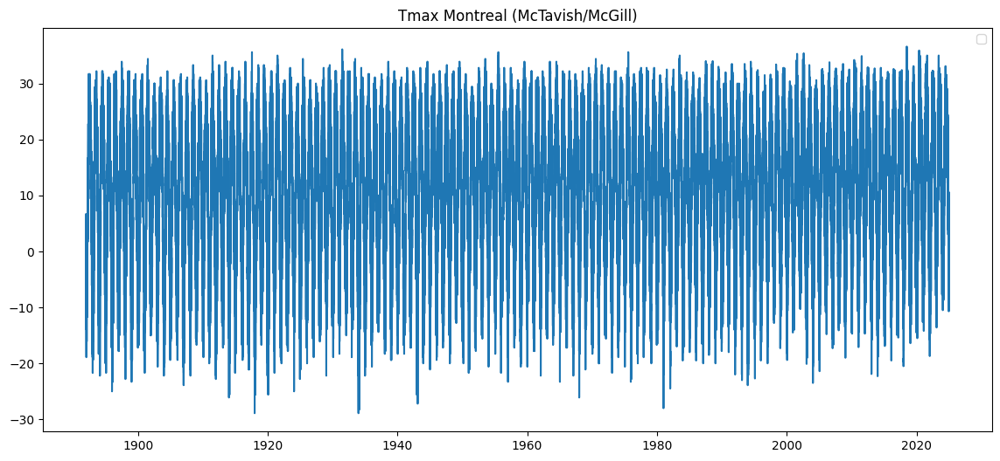

In [11]:
fig = plt.figure(figsize=(14,6))

ax = plt.plot(wx_df.index, wx_df[Tmax])

plt.title(f'Tmax {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/634575607.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


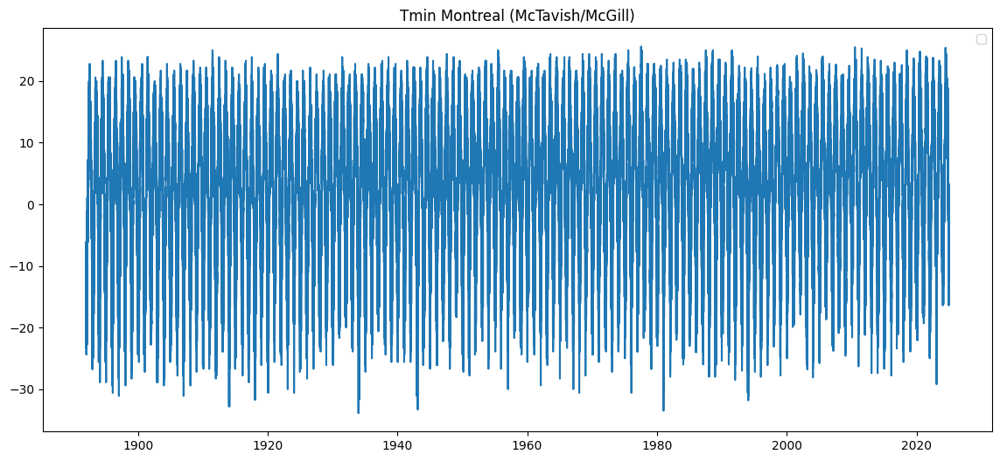

In [12]:
fig = plt.figure(figsize=(14,6))

ax = plt.plot(wx_df.index, wx_df[Tmin])

plt.title(f'Tmin {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/1541288815.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


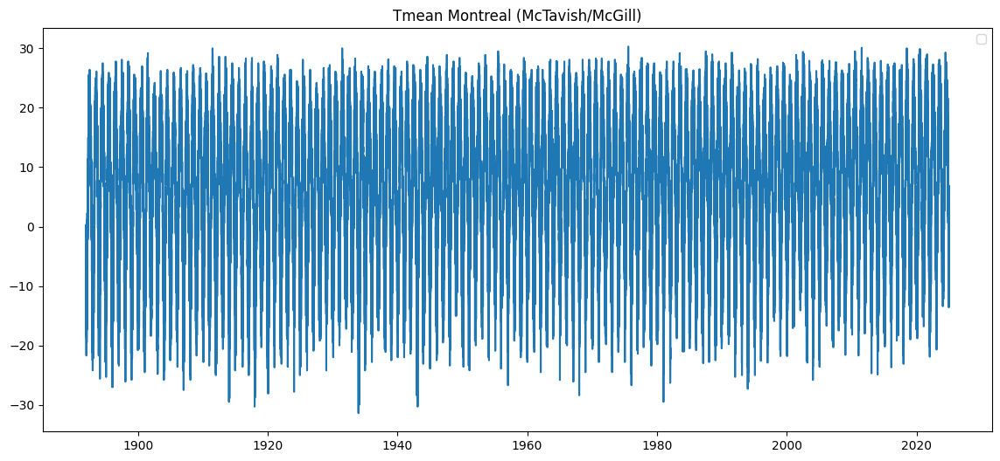

In [13]:
fig = plt.figure(figsize=(14,6))

ax = plt.plot(wx_df.index, wx_df[Tmean])

plt.title(f'Tmean {stn}')

plt.legend()

plt.show()

### Plot temperature trend by months

/tmp/ipykernel_1424276/897467635.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


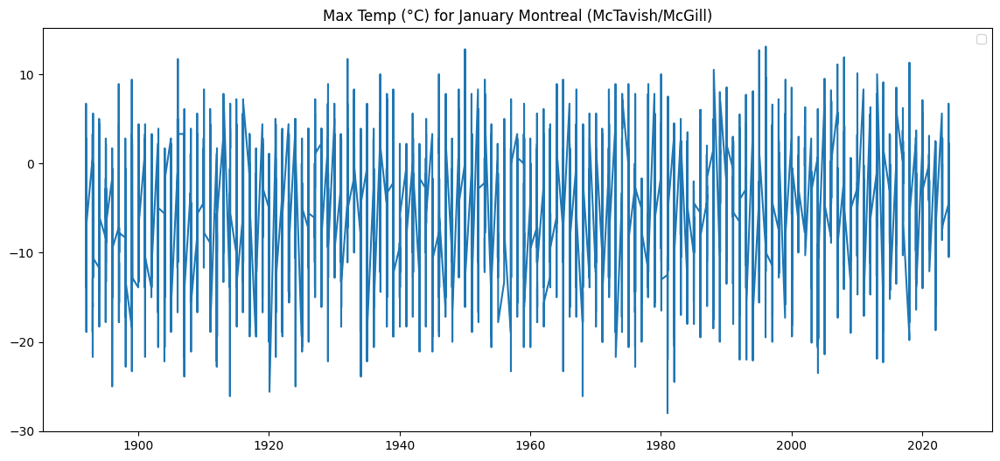

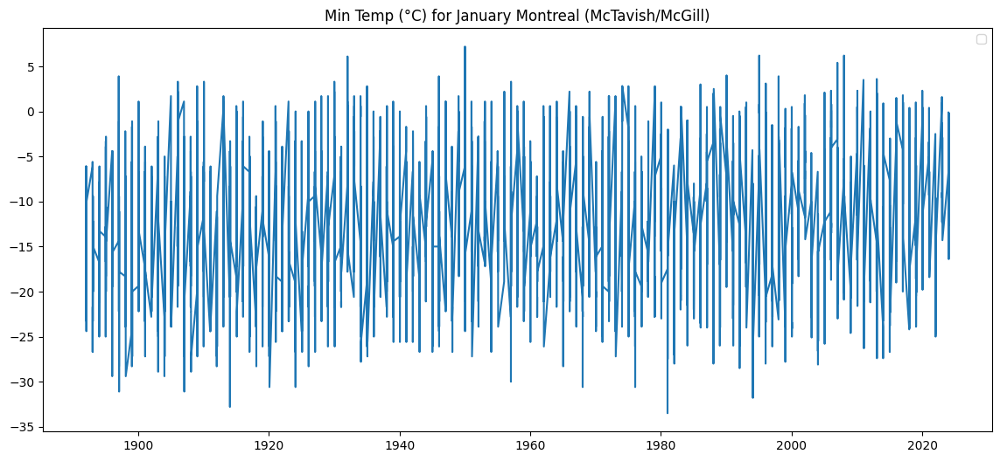

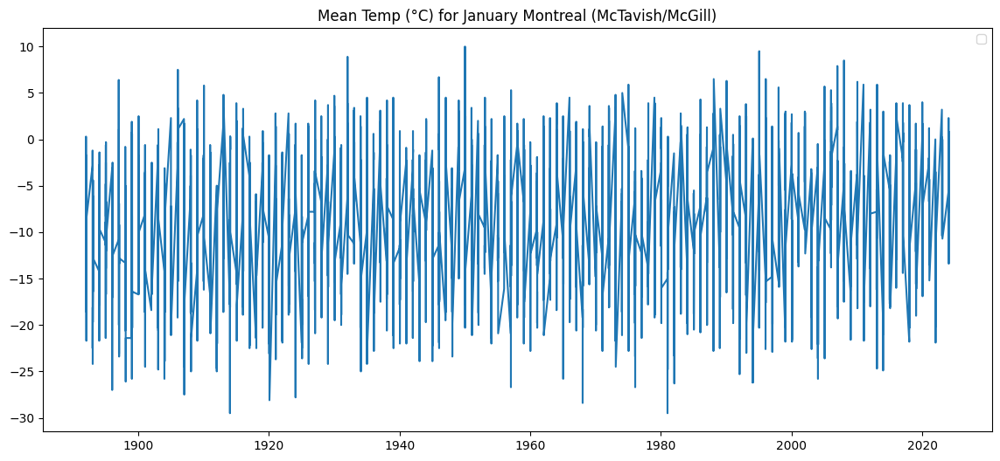

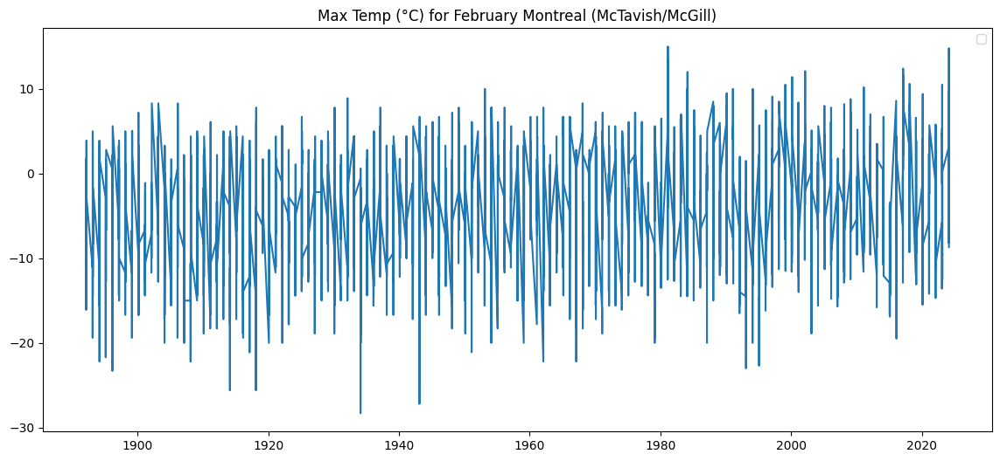

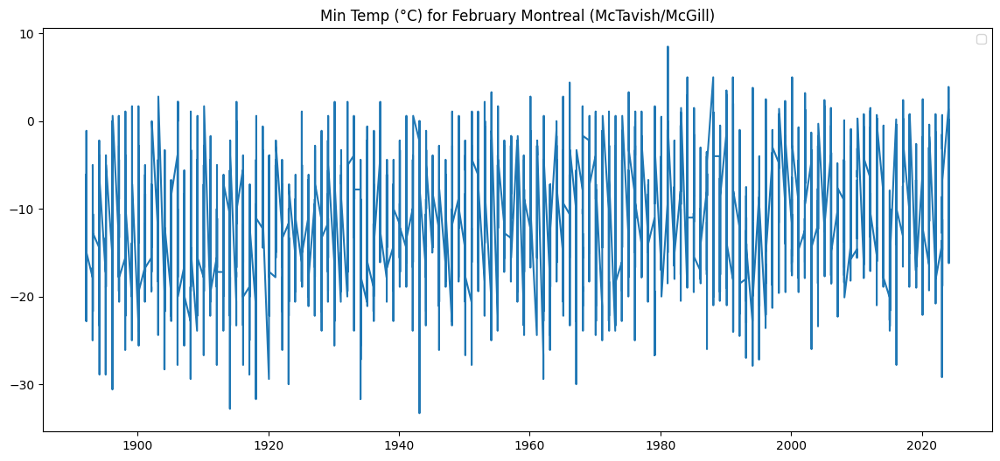

...

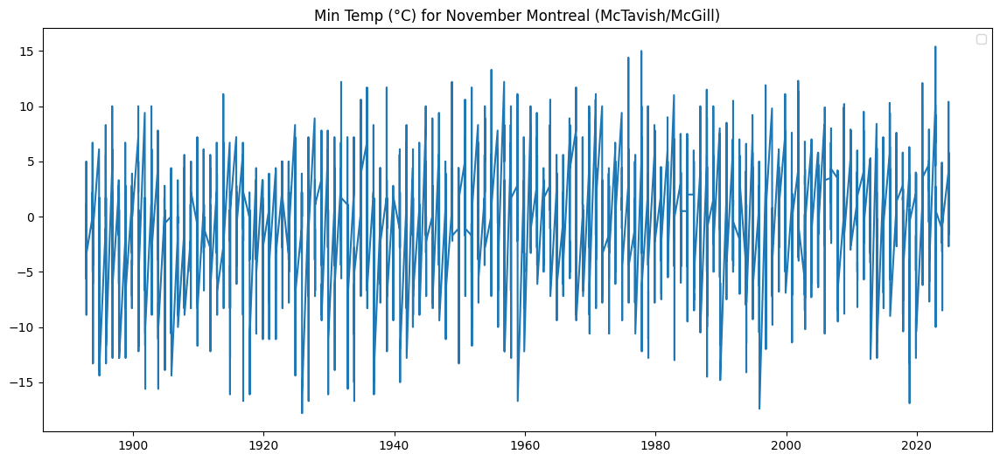

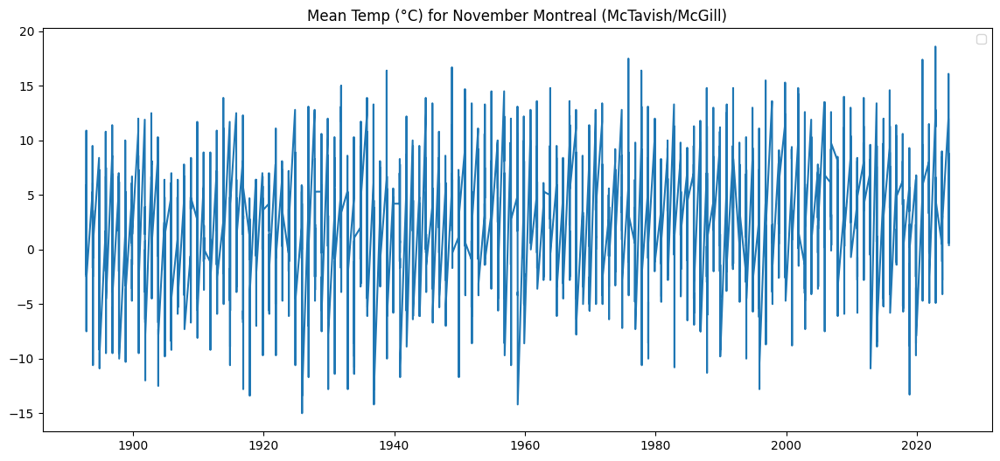

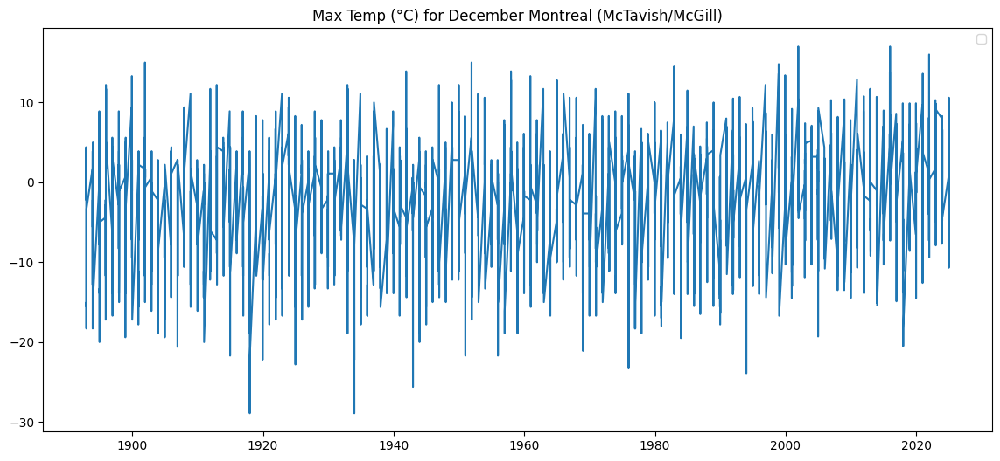

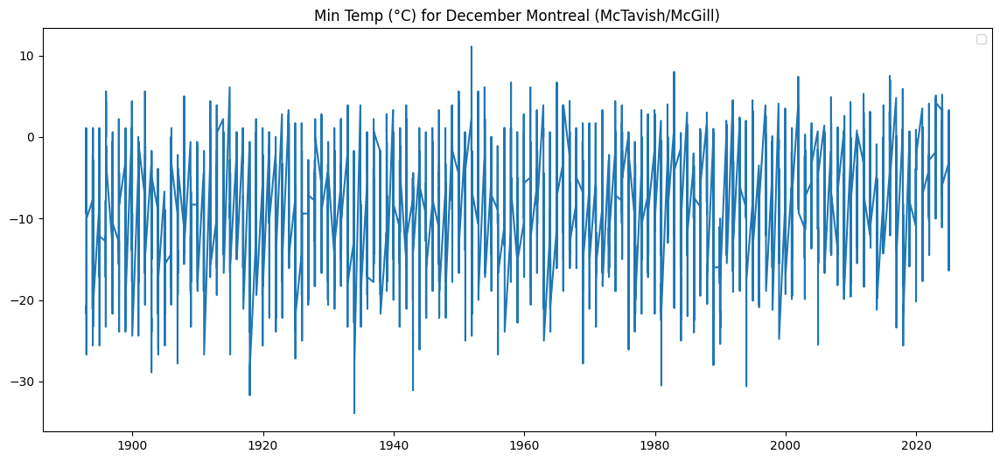

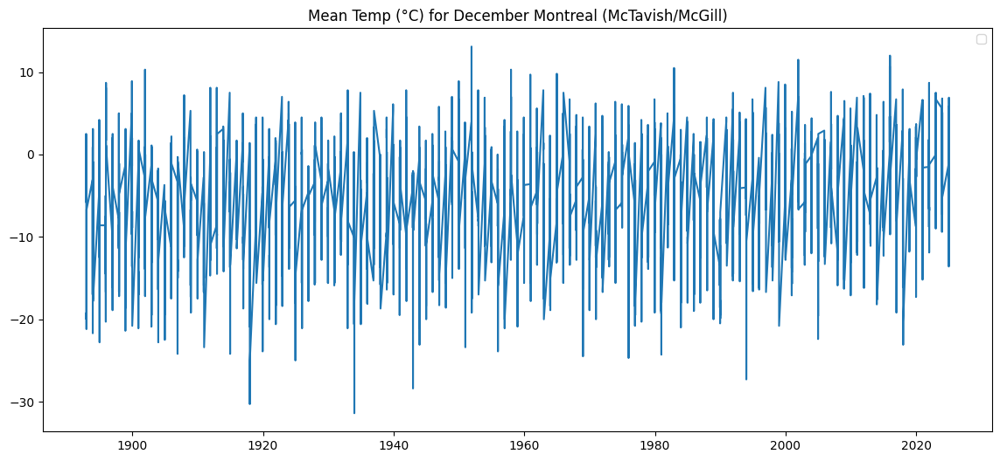

In [14]:
for month in range(1,13):

    month_str = pd.to_datetime(month, format='%m').strftime('%B')

    for T in [Tmax, Tmin, Tmean]:

        tmp = wx_df[wx_df['Month'] == month][T]

        fig = plt.figure(figsize=(14,6))

        ax = plt.plot(tmp.index, tmp)

        plt.title(f'{T} for {month_str} {stn}')

        plt.legend()

        plt.show()

### Put the GreenHouse Gases dataframe and population dataframe on the same frequency as the climate data

In [15]:
if frequency == 'DLY':
    new_range = pd.date_range(start = start_wx, end = end_wx, freq="D")
    print(new_range)
    
    co2_df = co2_df.reindex(new_range)
    co2_df = co2_df.resample('D').interpolate()

    ch4_df = ch4_df.reindex(new_range)
    ch4_df = ch4_df.resample('D').interpolate()

    pop_df = pop_df.reindex(new_range)
    pop_df = pop_df.resample('D').interpolate()
    
elif frequency == 'MLY':
    new_range = pd.date_range(start = start_wx, end = end_wx, freq="ME")
    print(new_range)

    co2_df = co2_df.reindex(new_range)
    co2_df = co2_df.resample('ME').interpolate()

    ch4_df = ch4_df.reindex(new_range)
    ch4_df = ch4_df.resample('ME').interpolate()

    pop_df = pop_df.reindex(new_range)
    pop_df = pop_df.resample('ME').interpolate()
else :
    print('Frequency is NOT monthly or daily')

DatetimeIndex(['1892-01-01', '1892-01-02', '1892-01-03', '1892-01-04',
               '1892-01-05', '1892-01-06', '1892-01-07', '1892-01-08',
               '1892-01-09', '1892-01-10',
               ...
               '2024-12-22', '2024-12-23', '2024-12-24', '2024-12-25',
               '2024-12-26', '2024-12-27', '2024-12-28', '2024-12-29',
               '2024-12-30', '2024-12-31'],
              dtype='datetime64[ns]', length=48578, freq='D')


In [16]:
co2_df

,CH4
1892-01-01,859.921329
1892-01-02,859.925885
1892-01-03,859.930442
1892-01-04,859.934998
1892-01-05,859.939554
...,...
2024-12-27,1934.802141
2024-12-28,1934.802141
2024-12-29,1934.802141
2024-12-30,1934.802141


In [17]:
ch4_df

,CO2
1892-01-01,294.800000
1892-01-02,294.799727
1892-01-03,294.799454
1892-01-04,294.799180
1892-01-05,294.798907
...,...
2024-12-27,424.610000
2024-12-28,424.610000
2024-12-29,424.610000
2024-12-30,424.610000


In [18]:
pop_df

,Population
1892-01-01,2.609199e+05
1892-01-02,2.609370e+05
1892-01-03,2.609540e+05
1892-01-04,2.609711e+05
1892-01-05,2.609881e+05
...,...
2024-12-27,2.200807e+06
2024-12-28,2.200807e+06
2024-12-29,2.200807e+06
2024-12-30,2.200807e+06


### Put all the data into a single dataframe

In [19]:
full_df = pd.concat([co2_df, ch4_df, pop_df, wx_df[[Tmax,Tmin]]], axis=1)
full_df

,CH4,CO2,Population,Max Temp (°C),Min Temp (°C)
1892-01-01,859.921329,294.800000,2.609199e+05,-5.6,-11.7
1892-01-02,859.925885,294.799727,2.609370e+05,6.7,-6.1
1892-01-03,859.930442,294.799454,2.609540e+05,2.2,-7.8
1892-01-04,859.934998,294.799180,2.609711e+05,-7.2,-15.0
1892-01-05,859.939554,294.798907,2.609881e+05,-12.2,-16.7
...,...,...,...,...,...
2024-12-27,1934.802141,424.610000,2.200807e+06,-6.1,-13.2
2024-12-28,1934.802141,424.610000,2.200807e+06,-1.7,-9.6
2024-12-29,1934.802141,424.610000,2.200807e+06,7.6,-2.6
2024-12-30,1934.802141,424.610000,2.200807e+06,10.6,3.3


### Plotting interesting events

/tmp/ipykernel_1424276/3299638578.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


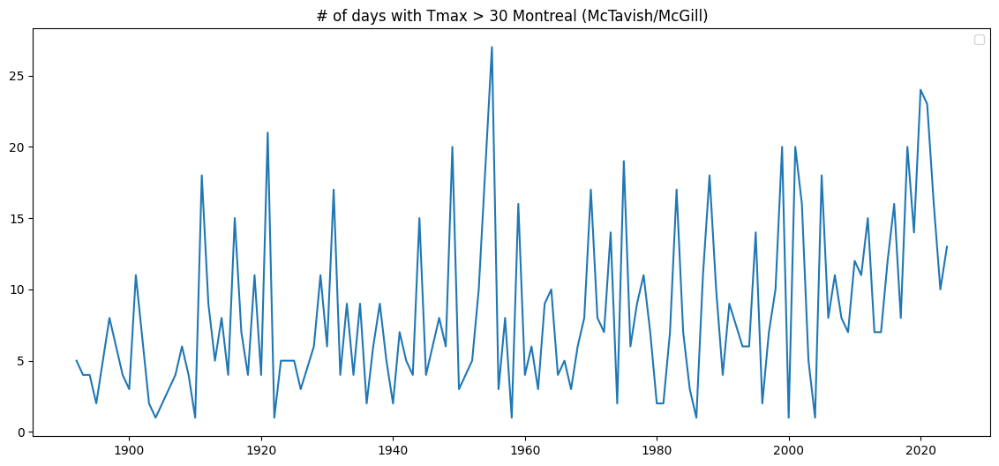

In [28]:
tmp = wx_df[wx_df[Tmax] > 30.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmax > 30 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/2223336849.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


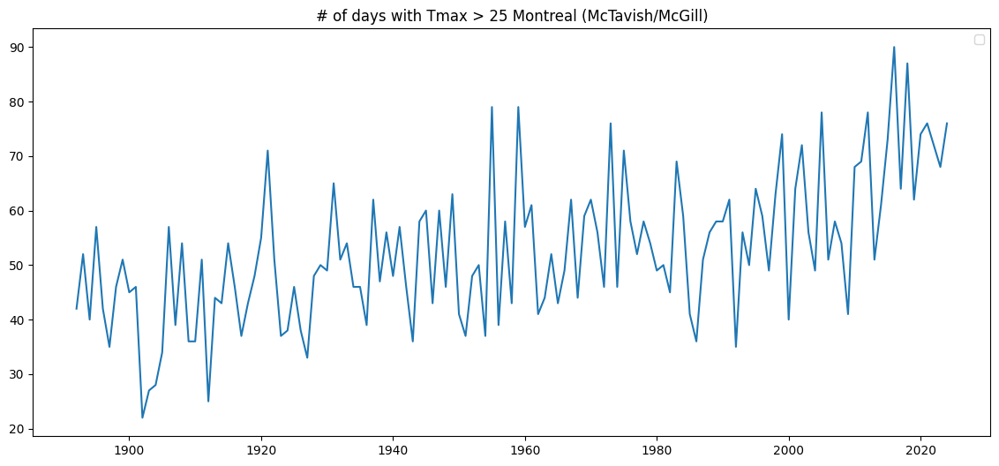

In [31]:
tmp = wx_df[wx_df[Tmax] > 25.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmax > 25 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/1319983928.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


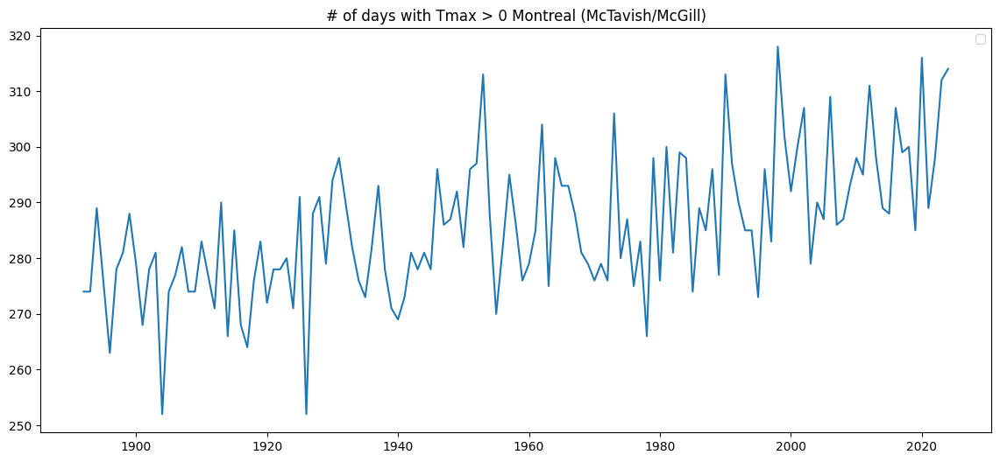

In [40]:
tmp = wx_df[wx_df[Tmax] > 0.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmax > 0 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/2363445461.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


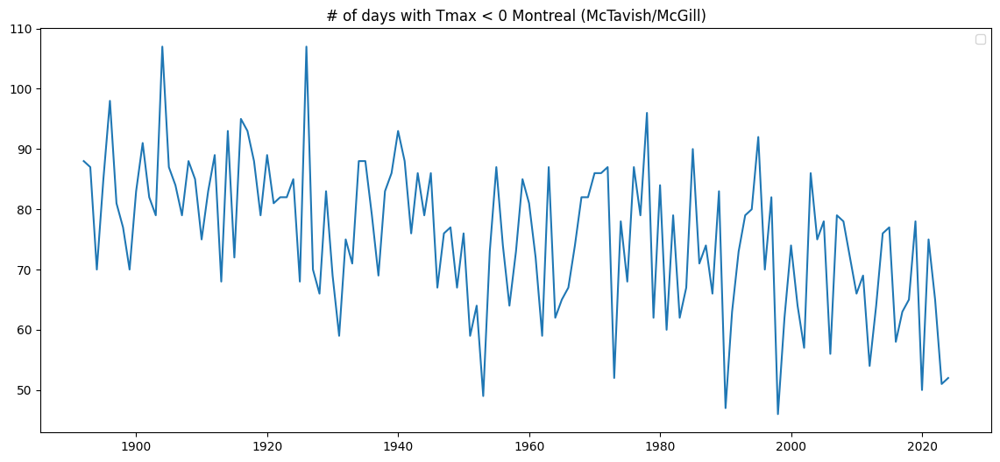

In [41]:
tmp = wx_df[wx_df[Tmax] < 0.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmax < 0 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/18135110.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


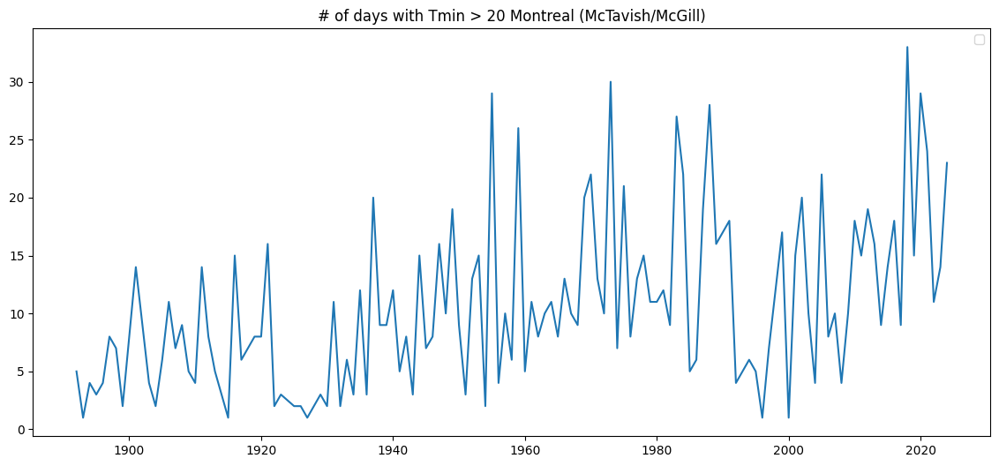

In [32]:
tmp = wx_df[wx_df[Tmin] > 20.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmin > 20 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/3323546009.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


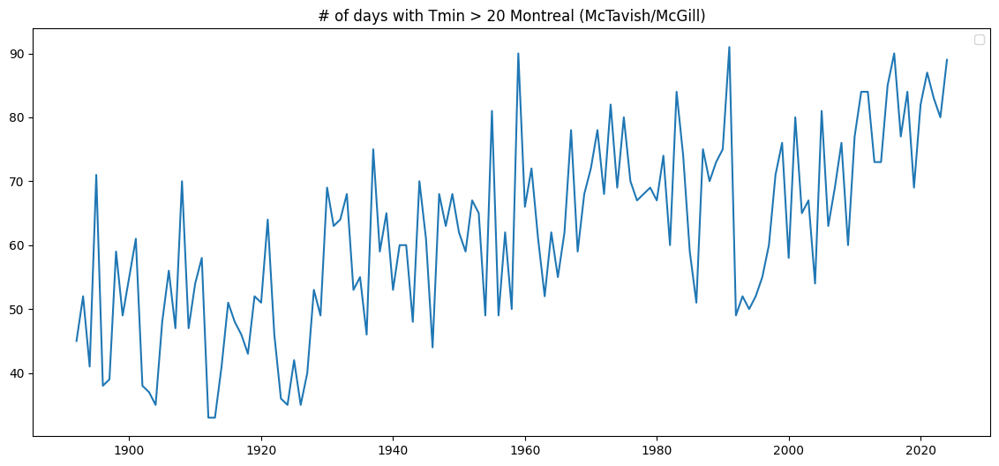

In [34]:
tmp = wx_df[wx_df[Tmin] > 15.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmin > 15 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/1086223956.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


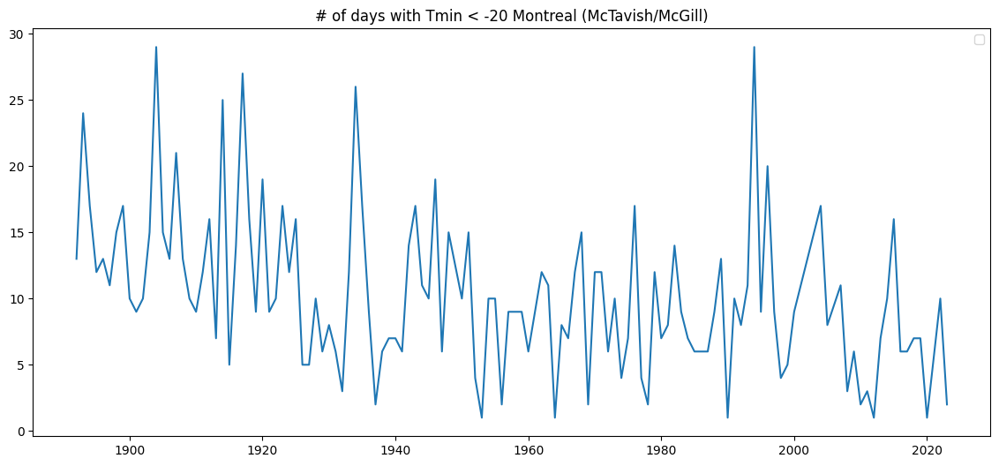

In [35]:
tmp = wx_df[wx_df[Tmin] < -20.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmin < -20 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/2341772975.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


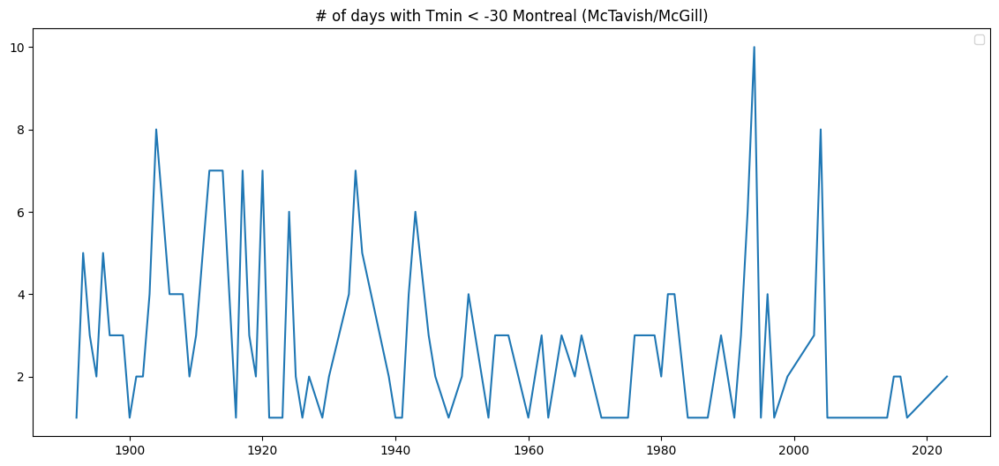

In [37]:
tmp = wx_df[wx_df[Tmin] < -25.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmin < -30 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/3838224248.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


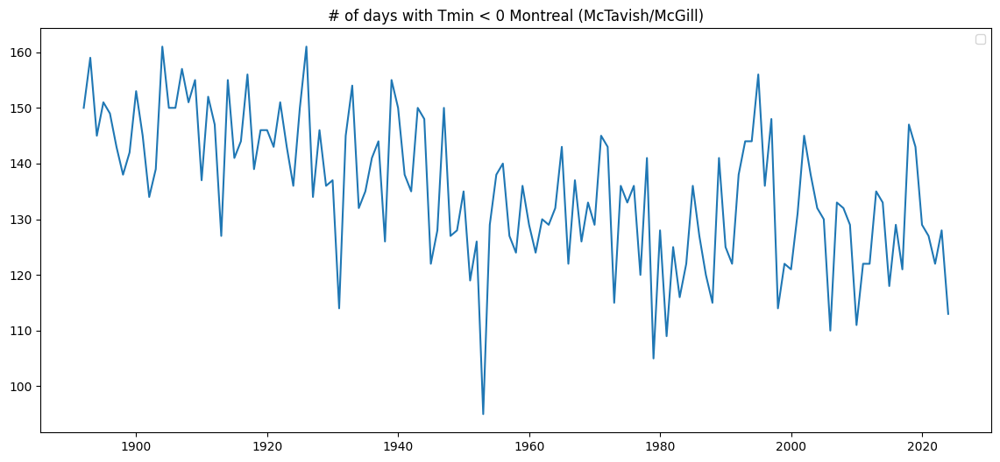

In [38]:
tmp = wx_df[wx_df[Tmin] < 0.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmin < 0 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/561167629.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


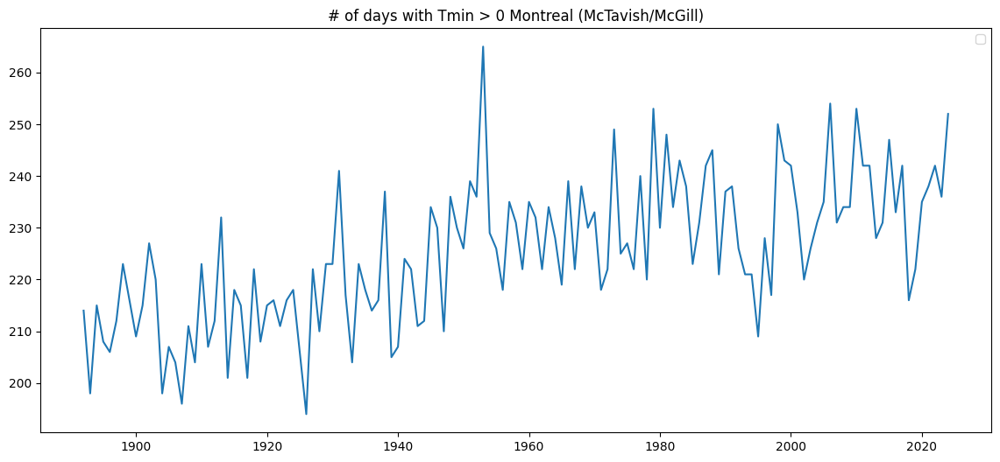

In [39]:
tmp = wx_df[wx_df[Tmin] > 0.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Tmin > 0 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/630593722.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


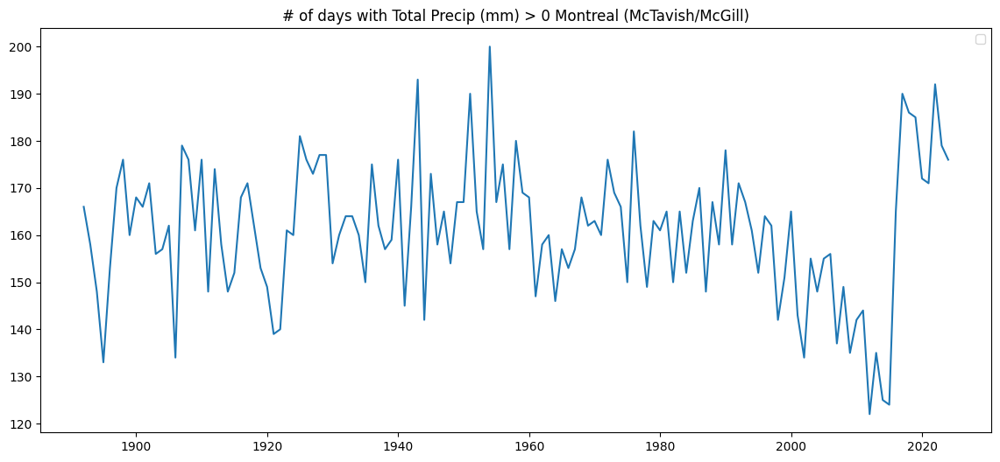

In [43]:
tmp = wx_df[wx_df['Total Precip (mm)'] > 0.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Total Precip (mm) > 0 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/3839611631.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


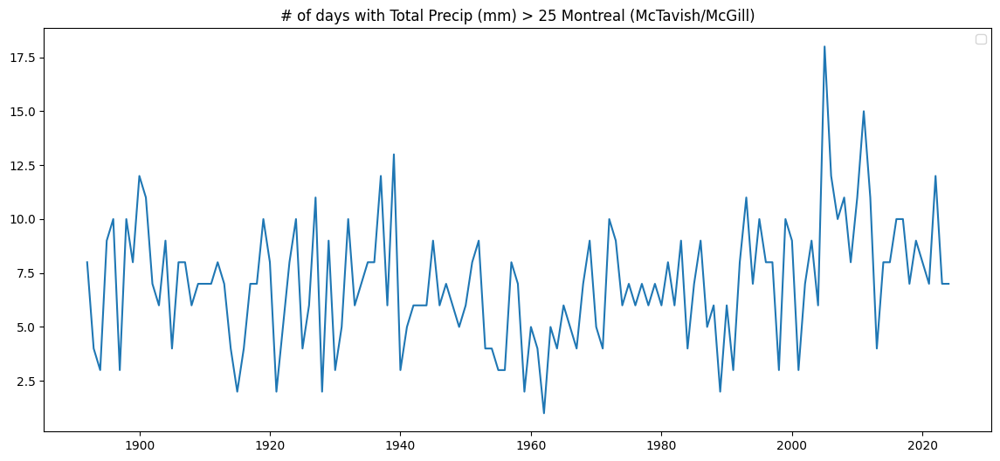

In [47]:
tmp = wx_df[wx_df['Total Precip (mm)'] > 25.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Total Precip (mm) > 25 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/2200577005.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


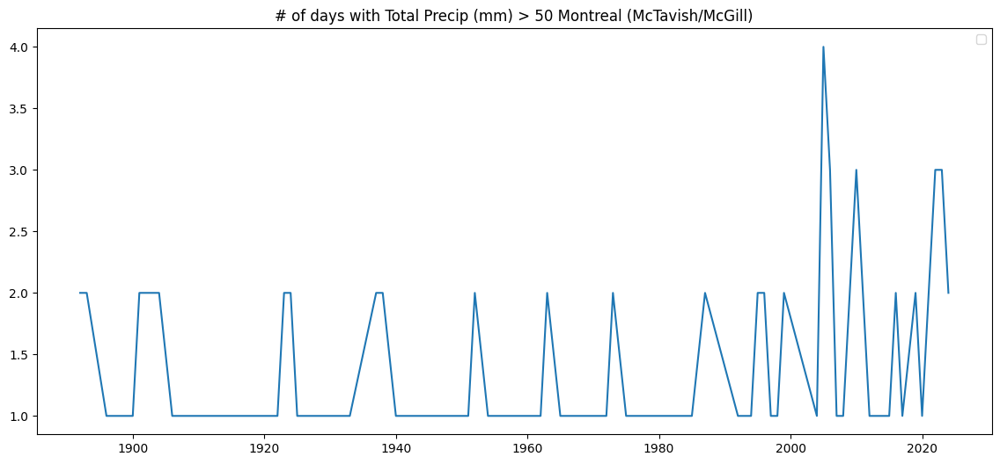

In [48]:
tmp = wx_df[wx_df['Total Precip (mm)'] > 50.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Total Precip (mm) > 50 {stn}')

plt.legend()

plt.show()

/tmp/ipykernel_1424276/1324484301.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


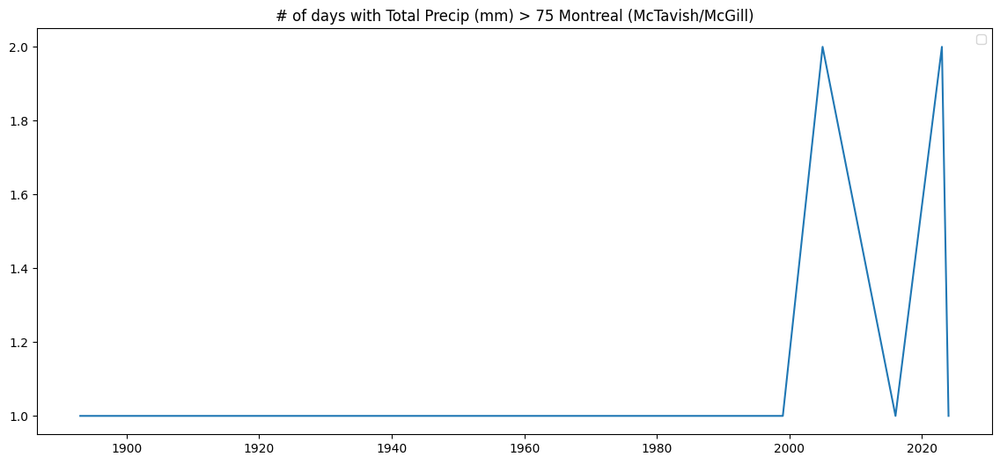

In [49]:
tmp = wx_df[wx_df['Total Precip (mm)'] > 75.].groupby('Year').count()

fig = plt.figure(figsize=(14,6))

ax = plt.plot(tmp.index, tmp['Station'])

plt.title(f'# of days with Total Precip (mm) > 75 {stn}')

plt.legend()

plt.show()

In [52]:
tmp = wx_df[wx_df[Tmin] > 0.].groupby('Year').count()
tmp = tmp.reset_index()

In [57]:
tmp.dtypes

Year                         int64
Station                      int64
Longitude (x)                int64
Latitude (y)                 int64
Station Name                 int64
Climate ID                   int64
Month                        int64
Day                          int64
Data Quality                 int64
Max Temp (°C)                int64
Max Temp Flag                int64
Min Temp (°C)                int64
Min Temp Flag                int64
Mean Temp (°C)               int64
Mean Temp Flag               int64
Heat Deg Days (°C)           int64
Heat Deg Days Flag           int64
Cool Deg Days (°C)           int64
Cool Deg Days Flag           int64
Total Rain (mm)              int64
Total Rain Flag              int64
Total Snow (cm)              int64
Total Snow Flag              int64
Total Precip (mm)            int64
Total Precip Flag            int64
Snow on Grnd (cm)            int64
Snow on Grnd Flag            int64
Dir of Max Gust (10s deg)    int64
Dir of Max Gust Flag

In [56]:
px.line(tmp, x='Year', y='Station', title='Station Counts Over Years')

In [42]:
cols

['Max Temp (°C)',
 'Max Temp Flag',
 'Min Temp (°C)',
 'Min Temp Flag',
 'Mean Temp (°C)',
 'Mean Temp Flag',
 'Heat Deg Days (°C)',
 'Heat Deg Days Flag',
 'Cool Deg Days (°C)',
 'Cool Deg Days Flag',
 'Total Rain (mm)',
 'Total Rain Flag',
 'Total Snow (cm)',
 'Total Snow Flag',
 'Total Precip (mm)',
 'Total Precip Flag',
 'Snow on Grnd (cm)',
 'Snow on Grnd Flag',
 'Dir of Max Gust (10s deg)',
 'Dir of Max Gust Flag',
 'Spd of Max Gust (km/h)',
 'Spd of Max Gust Flag']

In [21]:
full_df.isna().sum()

CH4              0
CO2              0
Population       0
Max Temp (°C)    0
Min Temp (°C)    0
dtype: int64

In [22]:
tmp = wx_df.groupby(['Year']).count()

tmp[tmp['Station'] < 365]

,Station,Longitude (x),Latitude (y),Station Name,Climate ID,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
Year,,,,,,,,,,,,,,,,,,,,,
